In [7]:
import pandas as pd
import numpy as np
from pathlib import Path
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt

### Data Preprocessing

In [8]:
dfs = []

for f in Path().iterdir():
    if f.suffix=='.csv':
        df = pd.read_csv(f)
        df['Stock'] = f.stem
        dfs.append(df)

all = pd.concat(dfs)

In [9]:
melted = all.melt(id_vars=['Date', 'Stock'])
melted['var_name'] = melted['variable'] + '_' + melted['Stock']
melted = melted.drop(columns=['Stock', 'variable'])
melted['Date'] = pd.to_datetime(melted['Date'])
final = melted.pivot(index='Date', columns='var_name', values='value')
final = final.dropna()

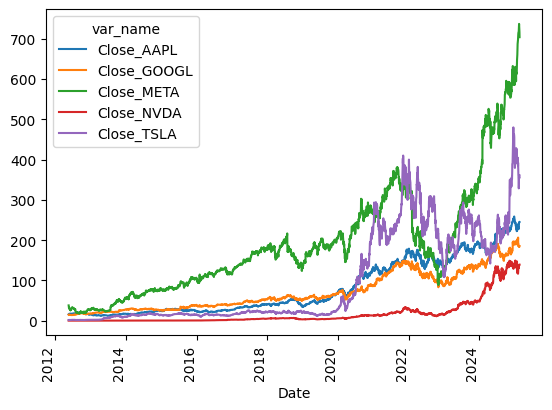

In [10]:
final[[c for c in final.columns if 'Close' in c]].plot()
plt.xticks(rotation=90)
plt.show()

In [11]:
final.columns

Index(['Close_AAPL', 'Close_GOOGL', 'Close_META', 'Close_NVDA', 'Close_TSLA',
       'High_AAPL', 'High_GOOGL', 'High_META', 'High_NVDA', 'High_TSLA',
       'Low_AAPL', 'Low_GOOGL', 'Low_META', 'Low_NVDA', 'Low_TSLA',
       'Open_AAPL', 'Open_GOOGL', 'Open_META', 'Open_NVDA', 'Open_TSLA',
       'Volume_AAPL', 'Volume_GOOGL', 'Volume_META', 'Volume_NVDA',
       'Volume_TSLA'],
      dtype='object', name='var_name')

In [12]:
train = final.loc[:'2021']
valid = final.loc['2021':'2022']
test = final.loc['2022':]
print(train.shape, valid.shape, test.shape)

(2422, 25) (503, 25) (785, 25)


In [13]:
final.to_csv('data.csv')

### Prepping Time Series

In [14]:
def to_windows(dataset, length):
    dataset = dataset.window(length, shift=1, drop_remainder=True)
    return dataset.flat_map(lambda window_ds: window_ds.batch(length))

def to_seq2seq_dataset(series, seq_length=56, ahead=14, columns=[0],
                       batch_size=8, shuffle=False, seed=None):
    ds = to_windows(tf.data.Dataset.from_tensor_slices(series), ahead + 1)
    ds = to_windows(ds, seq_length).map(
        lambda S: (S[:, 0], tf.gather(S[:, 1:, :], columns, axis=2)))
    if shuffle:
        ds = ds.shuffle(8 * batch_size, seed=seed)
    return ds.batch(batch_size=batch_size)

In [15]:
columns = [0,1,2,3,4]
seq2seq_train = to_seq2seq_dataset(train, shuffle=True, seed=42, seq_length=60, columns=columns)
seq2seq_valid = to_seq2seq_dataset(valid, seq_length=60, columns=columns)

In [16]:
m = 3134
n = 25
seq_length = 60
output_length = 5

data = np.arange(m*n).reshape(m,n)
data

array([[    0,     1,     2, ...,    22,    23,    24],
       [   25,    26,    27, ...,    47,    48,    49],
       [   50,    51,    52, ...,    72,    73,    74],
       ...,
       [78275, 78276, 78277, ..., 78297, 78298, 78299],
       [78300, 78301, 78302, ..., 78322, 78323, 78324],
       [78325, 78326, 78327, ..., 78347, 78348, 78349]])

In [17]:
ahead = 14

dataset = to_windows(tf.data.Dataset.from_tensor_slices(data), ahead + 1)
list(dataset)

[<tf.Tensor: shape=(15, 25), dtype=int64, numpy=
 array([[  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
          13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24],
        [ 25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
          38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49],
        [ 50,  51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,
          63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74],
        [ 75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,
          88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99],
        [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112,
         113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124],
        [125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137,
         138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
        [150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162,
         163,

In [18]:
dataset2 = to_windows(dataset, seq_length)
list(dataset2)

[<tf.Tensor: shape=(60, 15, 25), dtype=int64, numpy=
 array([[[   0,    1,    2, ...,   22,   23,   24],
         [  25,   26,   27, ...,   47,   48,   49],
         [  50,   51,   52, ...,   72,   73,   74],
         ...,
         [ 300,  301,  302, ...,  322,  323,  324],
         [ 325,  326,  327, ...,  347,  348,  349],
         [ 350,  351,  352, ...,  372,  373,  374]],
 
        [[  25,   26,   27, ...,   47,   48,   49],
         [  50,   51,   52, ...,   72,   73,   74],
         [  75,   76,   77, ...,   97,   98,   99],
         ...,
         [ 325,  326,  327, ...,  347,  348,  349],
         [ 350,  351,  352, ...,  372,  373,  374],
         [ 375,  376,  377, ...,  397,  398,  399]],
 
        [[  50,   51,   52, ...,   72,   73,   74],
         [  75,   76,   77, ...,   97,   98,   99],
         [ 100,  101,  102, ...,  122,  123,  124],
         ...,
         [ 350,  351,  352, ...,  372,  373,  374],
         [ 375,  376,  377, ...,  397,  398,  399],
         [ 400,

In [19]:
dataset3 = dataset2.map(lambda S: (S[:, 0], S[:, 1:, 0:5]))
list(dataset3)

[(<tf.Tensor: shape=(60, 25), dtype=int64, numpy=
  array([[   0,    1,    2, ...,   22,   23,   24],
         [  25,   26,   27, ...,   47,   48,   49],
         [  50,   51,   52, ...,   72,   73,   74],
         ...,
         [1425, 1426, 1427, ..., 1447, 1448, 1449],
         [1450, 1451, 1452, ..., 1472, 1473, 1474],
         [1475, 1476, 1477, ..., 1497, 1498, 1499]])>,
  <tf.Tensor: shape=(60, 14, 5), dtype=int64, numpy=
  array([[[  25,   26,   27,   28,   29],
          [  50,   51,   52,   53,   54],
          [  75,   76,   77,   78,   79],
          ...,
          [ 300,  301,  302,  303,  304],
          [ 325,  326,  327,  328,  329],
          [ 350,  351,  352,  353,  354]],
  
         [[  50,   51,   52,   53,   54],
          [  75,   76,   77,   78,   79],
          [ 100,  101,  102,  103,  104],
          ...,
          [ 325,  326,  327,  328,  329],
          [ 350,  351,  352,  353,  354],
          [ 375,  376,  377,  378,  379]],
  
         [[  75,   76,   7

In [20]:
list(seq2seq_train)

[(<tf.Tensor: shape=(8, 60, 25), dtype=float64, numpy=
  array([[[1.82445469e+01, 1.44810390e+01, 2.89992256e+01, ...,
           1.68418000e+07, 6.16008000e+08, 4.32285000e+07],
          [1.84870987e+01, 1.47877340e+01, 2.88896427e+01, ...,
           1.36851000e+07, 4.03036000e+08, 2.15385000e+07],
          [1.81855545e+01, 1.52305737e+01, 2.86505566e+01, ...,
           1.18691000e+07, 4.51000000e+08, 2.35275000e+07],
          ...,
          [1.92872810e+01, 1.88964653e+01, 2.03223686e+01, ...,
           3.22367000e+07, 2.40596000e+08, 1.33455000e+07],
          [1.92171650e+01, 1.85536118e+01, 2.01530170e+01, ...,
           2.71618000e+07, 3.66360000e+08, 1.78950000e+07],
          [1.93700981e+01, 1.85653324e+01, 1.95652618e+01, ...,
           3.93218000e+07, 3.26568000e+08, 7.55400000e+06]],
  
         [[1.76095734e+01, 1.58324957e+01, 2.36197720e+01, ...,
           1.23102300e+08, 3.76516000e+08, 2.50950000e+07],
          [1.79065895e+01, 1.57661695e+01, 2.30619049e+01,

In [21]:
seq2seq_model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=[None, 25]),
    tf.keras.layers.LSTM(32, return_sequences=True),
    tf.keras.layers.LSTM(32, return_sequences=True),
    tf.keras.layers.LSTM(32, return_sequences=True),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(ahead*len(columns)),
    tf.keras.layers.Reshape((seq_length,ahead,len(columns)))
])

In [22]:
early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor="val_mae",
    patience=50,
    restore_best_weights=True)

opt = tf.keras.optimizers.Adam()
seq2seq_model.compile(loss=tf.keras.losses.Huber(),
              optimizer=opt,
              metrics=["mae"])
history = seq2seq_model.fit(seq2seq_train,
                    validation_data=seq2seq_valid,
                    epochs=500,
                    callbacks=[early_stopping_cb])

Epoch 1/500
    294/Unknown 17s 39ms/step - loss: 26.1782 - mae: 26.6362

c:\Users\benne\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


294/294 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 26.2662 - mae: 26.7243 - val_loss: 152.6172 - val_mae: 153.1172
Epoch 2/500
294/294 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 20.0426 - mae: 20.5336 - val_loss: 145.6333 - val_mae: 146.1333
Epoch 3/500
294/294 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 16.8356 - mae: 17.3217 - val_loss: 140.7430 - val_mae: 141.2430
Epoch 4/500
294/294 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 16.4716 - mae: 16.9603 - val_loss: 137.3940 - val_mae: 137.8940
Epoch 5/500
294/294 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 16.7106 - mae: 17.2013 - val_loss: 134.7884 - val_mae: 135.2884
Epoch 6/500
294/294 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - loss: 16.9005 - mae: 17.3919 - val_loss: 132.5992 - val_mae: 133.0992
Epoch 7/500
294/294 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 17.1679 - mae: 17.6595 - val_loss: 130.7061 - val_mae: 131.2061
Epoch 8/500
294/294 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 17.4239 - mae: 17.9158 - val_loss: 129.0640 - val_mae: 129.5

In [23]:
import numpy as np

X = valid.to_numpy()[np.newaxis, :seq_length]
y_pred_14 = seq2seq_model.predict(X)[0, -1]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


In [24]:
preds = valid.iloc[:seq_length+ahead, columns].copy()
preds['type'] = 'actual'
preds

var_name,Close_AAPL,Close_GOOGL,Close_META,Close_NVDA,Close_TSLA,type
Date,,,,,,
2021-01-04,126.405243,85.994766,267.916565,13.080303,243.256668,actual
2021-01-05,127.968071,86.688255,269.938873,13.370815,245.036667,actual
2021-01-06,123.660469,85.832840,262.307983,12.582567,251.993332,actual
2021-01-07,127.880135,88.396568,267.717346,13.310220,272.013336,actual
2021-01-08,128.983902,89.566818,266.551819,13.243139,293.339996,actual
...,...,...,...,...,...,...
2021-04-14,129.157120,111.690613,301.667633,15.243586,244.076660,actual
2021-04-15,131.573380,113.849785,306.648621,16.101954,246.283340,actual
2021-04-16,131.240768,113.725235,305.014862,15.877696,246.593338,actual


In [25]:
preds2 = pd.DataFrame(y_pred_14, columns=train.columns[columns], index=preds.iloc[-ahead:,:].index)
preds2['type'] = 'predicted'
preds2

var_name,Close_AAPL,Close_GOOGL,Close_META,Close_NVDA,Close_TSLA,type
Date,,,,,,
2021-03-31,128.344162,111.061653,319.010529,16.806551,94.539406,predicted
2021-04-01,128.492096,111.206886,319.266846,16.859154,94.828415,predicted
2021-04-05,128.729507,111.408058,319.375641,16.907465,94.971329,predicted
2021-04-06,128.816986,111.650635,319.784515,16.960489,95.216637,predicted
2021-04-07,128.999512,111.865509,319.974915,17.017063,95.469818,predicted
2021-04-08,129.146866,112.066376,320.441437,17.070141,95.560074,predicted
2021-04-09,129.295319,112.236794,320.492615,17.120609,95.851799,predicted
2021-04-12,129.450958,112.439270,320.614960,17.166517,95.962120,predicted
2021-04-13,129.602066,112.575317,321.031891,17.221251,96.208511,predicted


In [26]:
all_preds = pd.concat([preds, preds2])
all_preds.head()

var_name,Close_AAPL,Close_GOOGL,Close_META,Close_NVDA,Close_TSLA,type
Date,,,,,,
2021-01-04,126.405243,85.994766,267.916565,13.080303,243.256668,actual
2021-01-05,127.968071,86.688255,269.938873,13.370815,245.036667,actual
2021-01-06,123.660469,85.832840,262.307983,12.582567,251.993332,actual
2021-01-07,127.880135,88.396568,267.717346,13.310220,272.013336,actual
2021-01-08,128.983902,89.566818,266.551819,13.243139,293.339996,actual


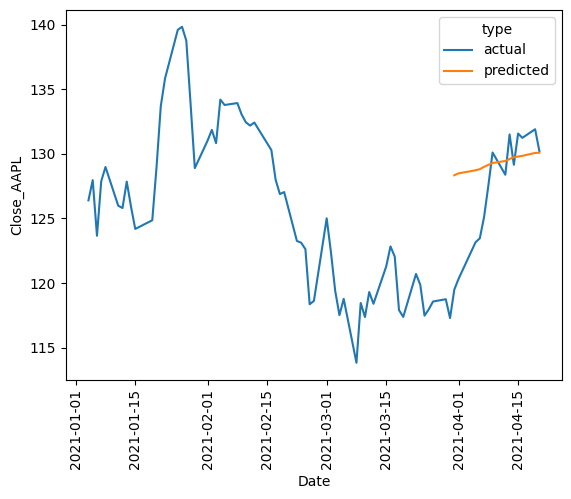

In [27]:
import seaborn as sns

sns.lineplot(all_preds, x='Date', y='Close_AAPL', hue='type')
plt.xticks(rotation=90)
plt.show()